# Guide to the notebook

## Interface

- Click a cell and press **Ctrl-Enter** or **Shift-Enter** will exectute the commands in cell
- If you get an unexpected result try to rerun the cell

# Practical — Genome-Wide Association Study (GWAS)

In this practical you will learn the essentials of running a Genome-Wide Association Study (GWAS), along with common pitfalls to avoid.

We will work **entirely from the command line** (Calysto Bash terminals) for data processing with **PLINK/REGENIE/LOCUSZOOM**, and switch to **R/Python** for visualisation.

* **PLINK documentation**  
  * [Original release](http://zzz.bwh.harvard.edu/plink/)  
  * [Current 1.9/2.0 versions](https://www.cog-genomics.org/plink/1.9/)

---

## How this notebook is organised

Each cell is either:

* **Markdown text** – like the block you are reading now.  
* **Calysto Bash** cell – runs Linux shell commands (labelled “Calysto Bash” at top-right).  
* **R** cell – runs R code (labelled “R4.4”).
* **Python** cell – runs Python code (labelled “Python 3.12”).

### Running cells

| Action | Windows / Linux | macOS |
|--------|-----------------|-------|
| Run selected cell | **Shift + Enter** | **Cmd + Enter** |
| Re-run after editing | **Ctrl + Enter** | **Cmd + Enter** |

> **Tip:** click inside a code cell before executing it.

---

Let’s start by inspecting your home directory.  
In the **Calysto Bash** cell below, list its contents:


In [1]:
# List files in your home folder
ls ~/

GWASintro_2025_REGENIE.ipynb  output  __pycache__



In [2]:
# create the output folder for storing output files
if [ ! -d ./output ]; then
  mkdir ./output
fi

List the content of the data folder that you will used next:

In [2]:
ls /home/student/USER/GWAS/data/

anno_file.txt
covar_2024_imp_2046_phenotype.txt
covar_2024_imp_2046.txt
covar_2024_WES_1826_covars.txt
covar_2024_WES_1826_phenotype.txt
covar_2024_WES_1826.txt
covar_PCs.txt
European_1w.bed
European_1w.bim
European_1w.eigenval
European_1w.eigenvec
European_1w.fam
European_1w_fig.eigenvec
European_1w_pca.txt
European_1w.ped
European_1w_phenotypes.txt
European_1w_QC.bed
European_1w_QC.bim
European_1w_QC.fam
European_1w_QC_PC20.assoc.linear
European_1w_QC_PC20.assoc.linear.adjusted
European_1w_QC_PC20.txt
European_1w_smartpca.par
mask_file.txt
phenotype.txt
plotPCA.py
plotPlink.py
plotPlink.R
regenie_anno_file_SNP.txt
regenie_mask_file.txt
regenie_set_list_CHR_POS.txt
set_list.txt
ukb23150_c1_c22_2024_WES_1826_QCpruned.bed
ukb23150_c1_c22_2024_WES_1826_QCpruned.bim
ukb23150_c1_c22_2024_WES_1826_QCpruned.fam
ukb23150_c22_2024_WES_1826.bed
ukb23150_c22_2024_WES_1826.bim
ukb23150_c22_2024_WES_1826.fam
ukb_imp_ALL_22_chr_trans_2024_imp_2046_QCpruned.bed
ukb_imp_ALL_22_chr_trans_2024_imp_2046

# Exercise A: running your first GWAS

**We're using simnulated UKBiobank data!!!**

Briefly, the GWAS data consist of SNP genotyping data from 10,000 European individuals (someone tells you that they are Europeans but you have to check by yourself) with information about their standing height (in meters).

To make sure the GWAS analyses will run fast the main data file (European_1w.bed) is in a binary format, which is not very reader friendly. 

However, PLINK (the program we will use to run the analyses) will print summary statistics about the data (number of SNPs, number of individuals etc) to the screen when you run an analysis.

Also, there are two additional data files, European_1w.bim and European_1w.fam, which are not in binary format and which contains information about the SNPs in the data and the individuals in the data, respectively.

(You can read more about the data format in the manuals linked to above - but for now this is all you need to know).

Let's look inside the .fam file, which contains information about the individuals. The head and tail commands shows the first and last 10 lines of the file. Try to run them:

### Note:

These 1w European samples were randomly sampled from the whole UKB cohort using stratified random sampling, in which 30% were sampled from the European population and the rest 70% sampled from the non-European population.

In [4]:
#head prints the 10 lines of the fam file
head /home/student/USER/GWAS/data/European_1w.fam
echo "-------------"
#tail prints the last 10 lines of the fam file
tail /home/student/USER/GWAS/data/European_1w.fam

1000992 1000992 0 0 1 1.68
1001118 1001118 0 0 1 1.61
1002621 1002621 0 0 2 1.5
1002993 1002993 0 0 2 1.57
1003258 1003258 0 0 2 1.64
1004181 1004181 0 0 2 1.76
1004240 1004240 0 0 1 1.62
1004285 1004285 0 0 1 1.66
1005685 1005685 0 0 2 1.58
1006795 1006795 0 0 2 1.55
-------------
6022702 6022702 0 0 2 1.74
6022727 6022727 0 0 1 1.73
6023248 6023248 0 0 2 1.55
6023752 6023752 0 0 2 1.69
6024345 6024345 0 0 2 1.62
6024403 6024403 0 0 1 1.7
6024436 6024436 0 0 1 1.8
6024522 6024522 0 0 1 1.88
6024942 6024942 0 0 2 1.7
6025409 6025409 0 0 2 1.54



'data.frame':	10000 obs. of  6 variables:
 $ V1: int  1000992 1001118 1002621 1002993 1003258 1004181 1004240 1004285 1005685 1006795 ...
 $ V2: int  1000992 1001118 1002621 1002993 1003258 1004181 1004240 1004285 1005685 1006795 ...
 $ V3: int  0 0 0 0 0 0 0 0 0 0 ...
 $ V4: int  0 0 0 0 0 0 0 0 0 0 ...
 $ V5: int  1 1 2 2 2 2 1 1 2 2 ...
 $ V6: num  1.68 1.61 1.5 1.57 1.64 1.76 1.62 1.66 1.58 1.55 ...


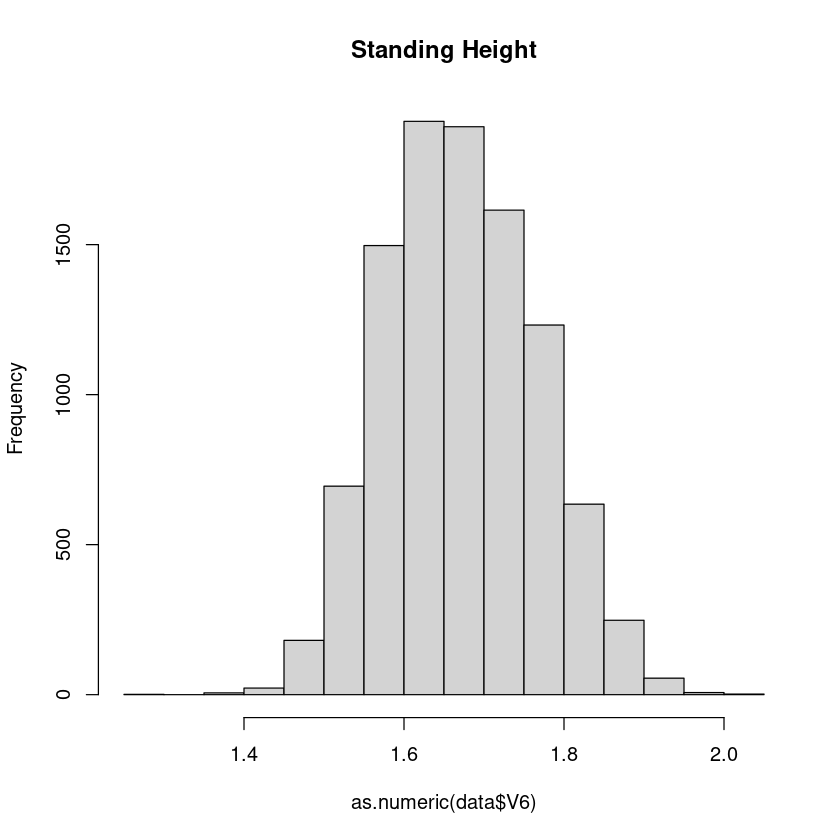

In [9]:
data <-read.table("/home/student/USER/GWAS/data/European_1w.fam")
str(data)
hist(as.numeric(data$V6),main="Standing Height")

In [5]:
#head prints the 10 lines of the bim file
head /home/student/USER/GWAS/data/European_1w.bim|column -t
echo "-------------"
#tail prints the last 10 lines of the bim file
tail /home/student/USER/GWAS/data/European_1w.bim|column -t

1  rs28659788   0  723307  G  C
1  rs116587930  0  727841  A  G
1  rs116720794  0  729632  T  C
1  rs3131972    0  752721  A  G
1  rs12184325   0  754105  T  C
1  rs3131962    0  756604  A  G
1  rs114525117  0  759036  A  G
1  rs3115850    0  761147  T  C
1  rs115991721  0  767096  G  A
1  rs12562034   0  768448  A  G
-------------
22  rs73174437     0  51177257  T  C
22  Affx-89025365  0  51178285  A  AC
22  Affx-89011903  0  51183153  T  TG
22  rs140584689    0  51183253  A  G
22  rs5771002      0  51183255  A  G
22  rs3865764      0  51185848  G  A
22  rs142680588    0  51193629  G  A
22  rs9616974      0  51217954  A  G
22  rs116656403    0  51224208  A  G
22  rs149733995    0  51238249  A  C



In [3]:
# Because we can not directly view a binary file, we convert the European_1w.bed file to the European_1w.ped to learn the content within it 
# Command for the convertion: plink --bfile /home/student/USER/GWAS/data/European_1w --recode tab --memory 5000 --out /home/student/USER/GWAS/data/test
# print the 20 rows of the ped file which is reader-friendly
echo 'sample-info columns (1-6) and three SNP (7-8, 9-10, 11-12)'
head -n 20 /home/student/USER/GWAS/data/European_1w.ped |
  awk '{print $1,$2,$3,$4,$5,$6,$7,$8,$9,$10,$11,$12}'

sample-info columns (1-6) and three SNP (7-8, 9-10, 11-12)
1000992 1000992 0 0 1 1.68 0 0 G G C C
1001118 1001118 0 0 1 1.61 0 0 G G C C
1002621 1002621 0 0 2 1.5 0 0 G G 0 0
1002993 1002993 0 0 2 1.57 0 0 G G C C
1003258 1003258 0 0 2 1.64 0 0 G G C C
1004181 1004181 0 0 2 1.76 0 0 G G C C
1004240 1004240 0 0 1 1.62 0 0 G G T C
1004285 1004285 0 0 1 1.66 0 0 G G C C
1005685 1005685 0 0 2 1.58 0 0 G G C C
1006795 1006795 0 0 2 1.55 0 0 G G C C
1006840 1006840 0 0 1 1.7 0 0 G G C C
1007533 1007533 0 0 1 1.667 C C G G C C
1007571 1007571 0 0 2 1.74 C C G G C C
1008723 1008723 0 0 2 1.63 0 0 G G C C
1010985 1010985 0 0 1 1.7 0 0 G G C C
1011289 1011289 0 0 1 1.88 0 0 G G C C
1012247 1012247 0 0 1 1.8 0 0 0 0 C C
1012361 1012361 0 0 1 1.77 0 0 G G C C
1012528 1012528 0 0 2 1.57 0 0 G G C C
1013817 1013817 0 0 2 1.62 0 0 0 0 C C



Let's try to perform a GWAS of our data, i.e. test each SNP for association with the standing height.

And let's try to do it using linear regression for standing height data

The PLINK option "--bfile /home/student/USER/GWAS/data/European_1w" will specify that the data PLINK should analyse are the files in folder called "/home/student/USER/GWAS/data/" with the prefix "European_1w".

"—linear" specifies that we want to perform GWAS using linear regression

"—adjust" tells PLINK to output a file that includes p-values that are adjusted for multiple testing using Bonferroni correction as well as other fancier methods.

"—autosome" only use autosomes and not X,Y,MT

Now perform the logistic regression on all the SNPs int the dataset using these options in PLINK by typing:

In [10]:
# Start running a GWAS using PLINK2  
# running about 3 minutes
source /home/student/miniconda3/bin/activate gwas
plink \
  --bfile /home/student/USER/GWAS/data/European_1w \
  --linear \
  --adjust \
  --autosome \
  --memory 5000 \
  --out ./output/European_1w_standing_height
conda deactivate

(gwas) PLINK v1.90b6.12 64-bit (28 Oct 2019)          www.cog-genomics.org/plink/1.9/
(C) 2005-2019 Shaun Purcell, Christopher Chang   GNU General Public License v3
Logging to ./output/European_1w_standing_height.log.
Options in effect:
  --adjust
  --autosome
  --bfile /home/student/USER/GWAS/data/European_1w
  --linear
  --memory 5000
  --out ./output/European_1w_standing_height

515181 MB RAM detected; reserving 5000 MB for main workspace.
784256 variants loaded from .bim file.
10000 people (4475 males, 5525 females) loaded from .fam.
10000 phenotype values loaded from .fam.
Using 1 thread (no multithreaded calculations invoked).
Before main variant filters, 10000 founders and 0 nonfounders present.
Calculating allele frequencies... done.
Total genotyping rate is 0.970031.
784256 variants and 10000 people pass filters and QC.
Phenotype data is quantitative.
Writing linear model association results to
./output/European_1w_standing_height.assoc.linear ... done.
--adjust: Genomic infla

Take a look at the text PLINK prints to your screen. Specifically, note the

 - number of SNPs

 - number of individuals

 - number of phenotype values
 


In [8]:
echo "first eight lines"
head ./output/European_1w_standing_height.assoc.linear
echo "significant variants"
awk '$NF<5e-8' ./output/European_1w_standing_height.assoc.linear|head

first eight lines
 CHR             SNP         BP   A1       TEST    NMISS       BETA         STAT            P 
   1      rs28659788     723307    G        ADD      746    0.00252       0.1906       0.8489
   1     rs116587930     727841    A        ADD     9037    0.01107        3.233     0.001227
   1     rs116720794     729632    T        ADD     9571   0.001857       0.5359        0.592
   1       rs3131972     752721    A        ADD     9921  -0.001197      -0.7754       0.4381
   1      rs12184325     754105    T        ADD     9987   0.001656       0.4847       0.6279
   1       rs3131962     756604    A        ADD     9978 -0.0007128      -0.4291       0.6678
   1     rs114525117     759036    A        ADD     9731  0.0005264       0.1498       0.8809
   1       rs3115850     761147    T        ADD     9494 -5.992e-05     -0.03547       0.9717
   1     rs115991721     767096    G        ADD     9954  -0.003317      -0.4835       0.6287
significant variants
   1      rs57527288

Next, plot the results of the GWAS using the following command run in R



Warning message:
“ggrepel: 13666 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


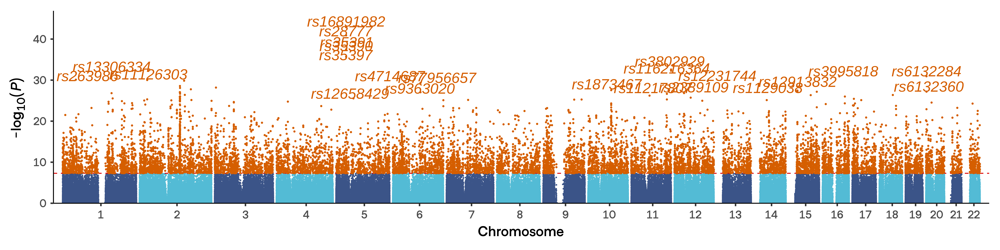

In [14]:
# running about 1 minutes
options(repr.plot.width = 16,
        repr.plot.height = 4,
        repr.plot.res = 600)

source("/home/student/USER/GWAS/data/plotPlink.R")

# plot the results (.assoc.linear is the output file from plink)
plots= plot_qqman(
  plink_assoc_file= "./output/European_1w_standing_height.assoc.linear",
  pheno_name= "Standing_height",
  save_plot = FALSE,
  lambda1_qq_pos = c(1.48, -5.5),
  lambda2_qq_pos = c(1.1, -4)
)
print(plots$manhattan_plot)

## Identify Significance Thresholds

- Genome-wide significance line – e.g. 5 × 10⁻⁸ for single-variant GWAS or a Bonferroni-corrected line for gene-based tests. Points above it are **significant**.

- Suggestive line (optional) – marks loci worth follow-up but not yet definitive.

A bonferroni corrected p-value threshold based on an initial p-value threshold of 0.05 is not shown on the plot. Explain how this threshold was reached and calculate the exact threshold using your knowledge of how many SNPs you have in your dataset (NB if you want to calculate log10 in R you can use the function log10).

In [9]:
wc -l /home/student/USER/GWAS/data/European_1w.bim

784256 /home/student/USER/GWAS/data/European_1w.bim



In [11]:
from math import log10
print(0.05 / 784_256)
-log10(0.05 / 784_256)

6.375469234535663e-08


7.195487845643804

- Using this threshold, does any of the SNPs in your dataset seem to be associated with standing height?

- Do your results seem plausible? Why/why not?

In [11]:
awk 'NR>1 && $5 < 6.375469234535663e-08' ./output/European_1w_standing_height.assoc.linear.adjusted | wc -l
awk 'NR>1 && $5 < 5e-08' ./output/European_1w_standing_height.assoc.linear.adjusted | wc -l

2191
2135




# Exercise B: checking if it went OK using QQ-plot

Now look at the QQ-plot that you already generated (second plot above). Here the red line is the x=y line and the thin curves are a confidence band.

- What does this plot suggest and why?


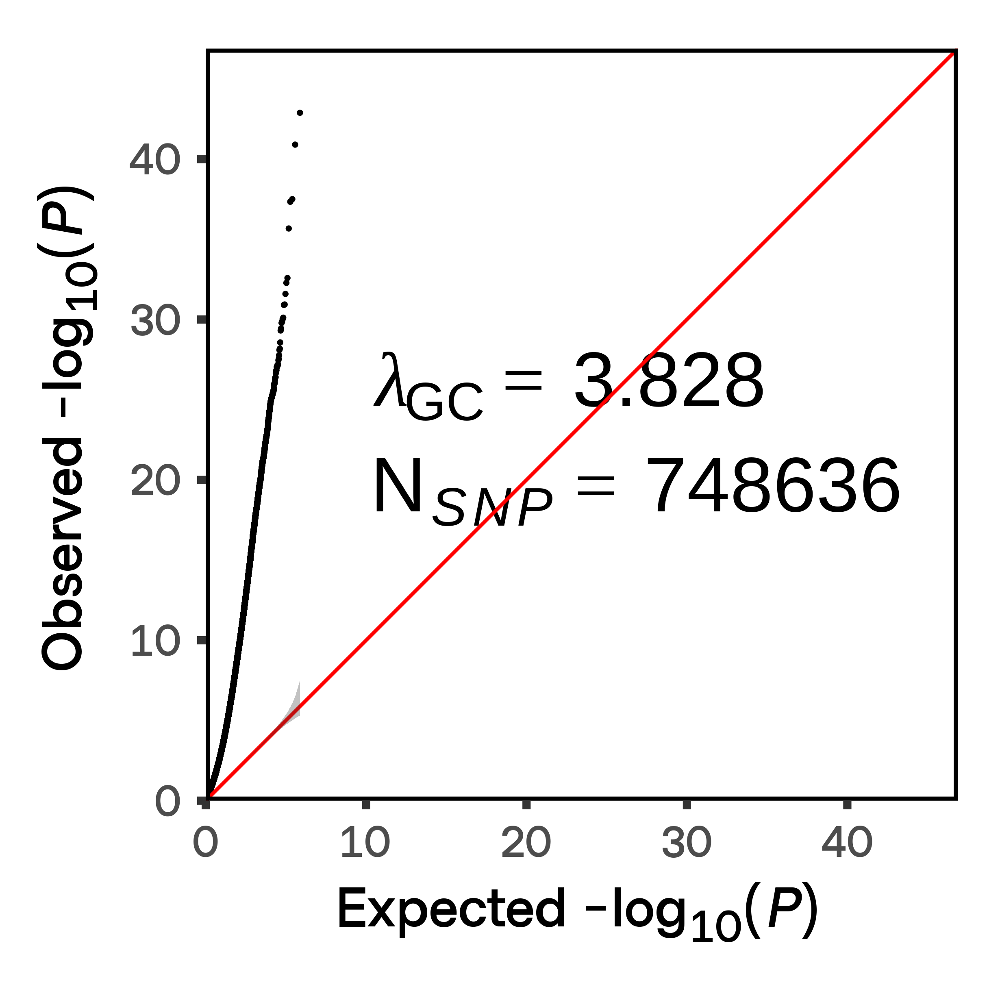

In [15]:
# running about 0.5 minutes
options(repr.plot.width = 4.1,
        repr.plot.height = 4.1,
        repr.plot.res = 600)
print(plots$qq_plot)

- Axes

    - X-axis: Expected −log₁₀ P under the null.

    - Y-axis: Observed −log₁₀ P from your test.

- Diagonal (= null)

    Points near the diagonal imply well-calibrated statistics.

- Genomic inflation factor (λ<sub>GC</sub>)

    λ ~ 1 → good; λ ≫ 1 → inflation; λ < 1 → conservative.

Use the QQ-plot together with the Manhattan plot: Manhattan tells where the signals are, QQ-plot tells whether your test statistics are globally trustworthy.

# Exercise C: QC your data

As you can see, a lot can go wrong if you do not check the quality of your data before running your GWAS! So if you want meaningful/useful output you always have to run a lot of quality checks (QC) before running the association tests. We will try to go through some useful QC steps now.

One potential problem in association studies is spurious relatedness, where some of the individuals in the sample are closely related. Closely related individuals can be inferred with PLINK using the following command, which only uses autosomal SNPs with a minor allele frequency > 5%:



In [12]:
# running about 2 minutes
source /home/student/miniconda3/bin/activate gwas
plink \
  --bfile /home/student/USER/GWAS/data/European_1w \
  --genome \
  --autosome \
  --maf 0.05 \
  --memory 5000 \
  --out ./output/European_1w_genome
conda deactivate

(gwas) PLINK v1.90b6.12 64-bit (28 Oct 2019)          www.cog-genomics.org/plink/1.9/
(C) 2005-2019 Shaun Purcell, Christopher Chang   GNU General Public License v3
Logging to ./output/European_1w_genome.log.
Options in effect:
  --autosome
  --bfile /home/student/USER/GWAS/data/European_1w
  --genome
  --maf 0.05
  --memory 5000
  --out ./output/European_1w_genome

515181 MB RAM detected; reserving 5000 MB for main workspace.
784256 variants loaded from .bim file.
10000 people (4475 males, 5525 females) loaded from .fam.
10000 phenotype values loaded from .fam.
Using up to 31 threads (change this with --threads).
Before main variant filters, 10000 founders and 0 nonfounders present.
Calculating allele frequencies... done.
Total genotyping rate is 0.970031.
403893 variants removed due to minor allele threshold(s)
(--maf/--max-maf/--mac/--max-mac).
380363 variants and 10000 people pass filters and QC.
Phenotype data is quantitative.
IBD calculations complete.  
Finished writing ./output

In [16]:
head ./output/European_1w_genome.genome

     FID1     IID1     FID2     IID2 RT    EZ      Z0      Z1      Z2  PI_HAT PHE       DST     PPC   RATIO
  1000992  1000992  1001118  1001118 UN    NA  1.0000  0.0000  0.0000  0.0000  NA  0.740314  0.0000  1.6212
  1000992  1000992  1002621  1002621 UN    NA  1.0000  0.0000  0.0000  0.0000  NA  0.742542  0.0000  1.7359
  1000992  1000992  1002993  1002993 UN    NA  1.0000  0.0000  0.0000  0.0000  NA  0.721926  0.0000  1.0538
  1000992  1000992  1003258  1003258 UN    NA  1.0000  0.0000  0.0000  0.0000  NA  0.741646  0.0000  1.6746
  1000992  1000992  1004181  1004181 UN    NA  1.0000  0.0000  0.0000  0.0000  NA  0.742432  0.0000  1.6996
  1000992  1000992  1004240  1004240 UN    NA  1.0000  0.0000  0.0000  0.0000  NA  0.743650  0.0000  1.6686
  1000992  1000992  1004285  1004285 UN    NA  1.0000  0.0000  0.0000  0.0000  NA  0.741578  0.0000  1.6974
  1000992  1000992  1005685  1005685 UN    NA  1.0000  0.0000  0.0000  0.0000  NA  0.730170  0.0000  1.3393
  1000992  1000992  1006795 

The results can be summarised in a plot with the following Python code and gives the names of potential related pairs: 

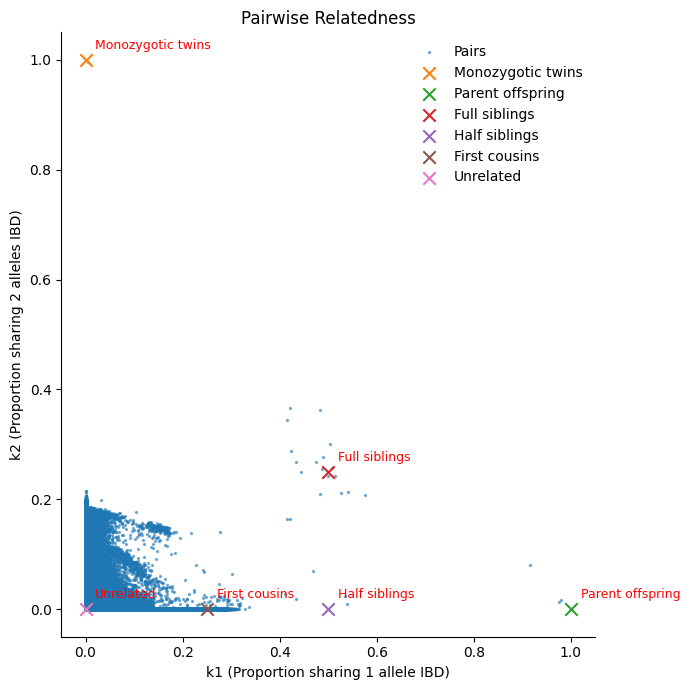

In [13]:
# running about 1.5 minutes
import sys
sys.path.append("/home/student/USER/GWAS/data/")
from plotPlink import plot_ibd

plot_ibd("./output/European_1w_genome.genome")

The figure shows estimates of the relatedness for all pairs of individuals.

For each pair k1 is the proportion of the genome where the pair shares 1 of their alleles identical-by-descent (IBD) and k2 is the proportion of the genome where the pair shares both their alleles IBD.

- The expected (k1,k2) values for simple relationships are shown in the figure. Are any of the individuals in your dataset closely related?

- What assumption in association studies is violated when individuals are related? 

- And last but not least: how would you recognize if the same person is included twice? (this actually happens often!)


We usually only remove 1. or 2. degree relatives (MZ,PO,FS,HS) from the analysis or we use a mixed model to take the relatedness into account. 

**Principal component analysis (PCA)** and a very similar methods called **multidimensional scaling** is also often used to reveal problems in the data.

Such analyses can be used to project all the genotype information (e.g. 500,000 marker sites) down to a low number of dimensions e.g. two.

## Multidimensional scaling

Multidimensional scaling based on your data can be performed with PLINK as follows (the option --mind is used to remove the few individuals which have more than 20% missingness):

In [14]:
# running about 3 minutes
source /home/student/miniconda3/bin/activate gwas
plink \
  --bfile /home/student/USER/GWAS/data/European_1w \
  --cluster \
  --mds-plot 2 \
  --mind 0.05 \
  --memory 5000 \
  --out ./output/European_1w_mds
conda deactivate

PLINK v1.9.0-b.7.8 64-bit (15 Jun 2025)            cog-genomics.org/plink/1.9/
(C) 2005-2025 Shaun Purcell, Christopher Chang   GNU General Public License v3
Logging to ./output/European_1w_mds.log.
Options in effect:
  --bfile /home/student/USER/GWAS/data/European_1w
  --cluster
  --mds-plot 2
  --memory 5000
  --mind 0.05
  --out ./output/European_1w_mds

515181 MB RAM detected; reserving 5000 MB for main workspace.
784256 variants loaded from .bim file.
10000 people (4475 males, 5525 females) loaded from .fam.
10000 phenotype values loaded from .fam.
323 people removed due to missing genotype data (--mind).
IDs written to ./output/European_1w_mds.irem .
Using up to 31 threads (change this with --threads).
Before main variant filters, 9677 founders and 0 nonfounders present.
Calculating allele frequencies... done.
Total genotyping rate in remaining samples is 0.970822.
784256 variants and 9677 people pass filters and QC.
Phenotype data is quantitative.
Distance matrix calculation com

Try to plot the results in Python:

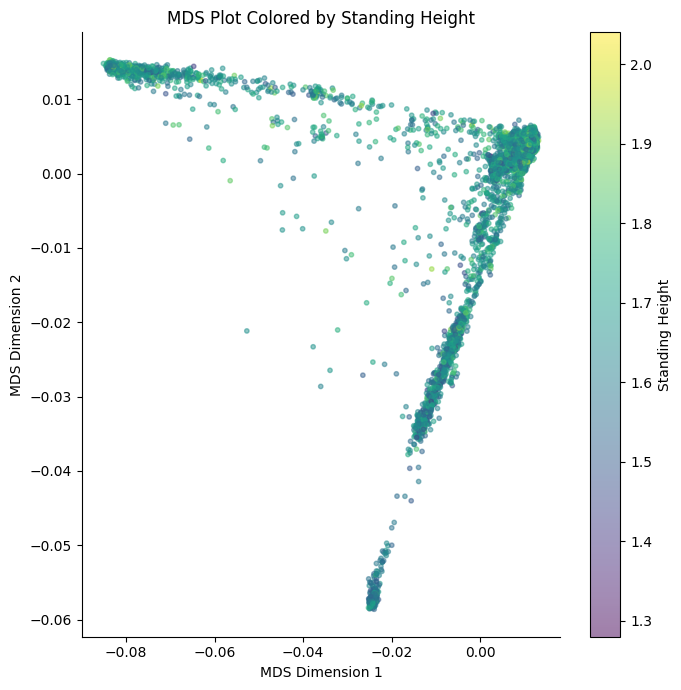

In [15]:
import sys
sys.path.append("/home/student/USER/GWAS/data/")
from plotPlink import plot_clusters

# plot the results (plink.mds is the output file from plink)
plot_clusters(
    "./output/European_1w_mds.mds",
    "/home/student/USER/GWAS/data/European_1w.fam"
)

It shows the first two dimensions and each individual is represented by a point.

Clustering of individuals with similar trait values may indicate batch bias or population structure.
- Do you see any clustering or gradients related to the trait values?
- What else could explain such patterns?

Let's perform PCA.

## PCA

Principal components analysis (PCA) is one of the most useful techniques to visualise genetic diversity in a dataset. The methodology is not restricted to genetic data, but in general allows breaking down high-dimensional datasets to two or more dimensions for visualisation in a two-dimensional space.

### Preparing the parameter file

For actually running the analysis, we use a software called **smartPCA** from the Eigensoft package. As many other tools from this and related packages, smartPCA reads in a parameter file which specifies its input and output files and options. The basic format of the parameter file looks like this:

In [16]:
cat /home/student/USER/GWAS/data/European_1w_smartpca.par

genotypename:   /home/student/USER/GWAS/data/European_1w.bed
snpname:        /home/student/USER/GWAS/data/European_1w.bim
indivname:      /home/student/USER/GWAS/data/European_1w.fam
evecoutname:    ./output/European_1w.eigenvec
evaloutname:    ./output/European_1w.eigenval
numoutevec:     20
numoutlieriter: 0
numthreads:     30
lsqproject:     YES
fastmode:       NO



Here, the first three parameters specify the input genotype files, as discussed above.

The next two rows specify two output file names, typically with ending *.evec and *.eval.

numoutevec specifies the number of principal components that we compute.


In [17]:
# # do not run!
# # running about 95 minutes
# source /home/student/miniconda3/bin/activate eigensoft
# start_time=$(date +%s)
# smartpca -p \
#   /home/student/USER/GWAS/data/European_1w_smartpca.par \
#   > ./output/European_1w_pca.log
# end_time=$(date +%s)
# elapsed_seconds=$((end_time - start_time))
# echo "Elapsed time: $(($elapsed_seconds / 60)) mins"
# conda deactivate

## Let's examine the pre-run results

In [18]:
# check the log
awk 'NR > 16 && NR < 35' /home/student/USER/GWAS/data/European_1w_pca.txt

lsqproject used
genetic distance set from physical distance
genotype file processed
snps deleted (nodata): 0.  deletesnpoutname: for detailsnumber of samples used: 10000 number of snps used: 784256
number of pops for axes: 238
Using 29 threads, and partial sum lookup algorithm.
 snp        Affx-89007868 ignored . allelecnt:     0  missing:  9245
 snp          rs200584816 ignored . allelecnt:     0  missing:     9
 snp        Affx-80267079 ignored . allelecnt:     0  missing:     9
 snp          rs200048444 ignored . allelecnt:     0  missing:     8
 snp          rs144879626 ignored . allelecnt:     0  missing:   127
 snp          rs139055451 ignored . allelecnt:     0  missing:   117
 snp        Affx-80290518 ignored . allelecnt:     0  missing:   102
 snp        Affx-89023000 ignored . allelecnt:     0  missing:    94
 snp        Affx-80267082 ignored . allelecnt:     0  missing:    23
 snp        Affx-80210147 ignored . allelecnt:     0  missing:     4
total number of snps killed in 

In [19]:
# top 10 rows of .eigenvec
head -n 10 /home/student/USER/GWAS/data/European_1w.eigenvec | column -t
# the first line is the eigenvalues for the requested 20 eigenvec

#eigvals:        267.904  85.642   27.427   14.541   8.699    4.969    4.628   4.246    4.017    3.854    3.826    3.709    3.586    3.446    3.308    3.169    3.054    2.875    2.800    2.768    
1000992:1000992  -0.0036  0.0213   -0.0248  -0.0101  -0.0042  -0.0044  0.0073  -0.0018  0.0003   -0.0099  -0.0030  0.0045   -0.0000  0.0039   -0.0001  -0.0006  0.0100   0.0049   0.0052   0.0011   1.68
1001118:1001118  0.0031   -0.0034  -0.0012  0.0239   0.0047   0.0013   0.0033  -0.0103  0.0296   0.0034   0.0062   -0.0123  -0.0016  -0.0113  0.0034   0.0115   0.0165   -0.0075  0.0133   0.0009   1.61
1002621:1002621  0.0038   -0.0021  -0.0010  0.0094   -0.0033  -0.0068  0.0060  0.0042   0.0064   -0.0007  0.0129   -0.0125  0.0074   -0.0031  0.0080   -0.0049  -0.0028  -0.0038  -0.0160  -0.0001  1.5
1002993:1002993  -0.0356  -0.0106  0.0007   -0.0007  -0.0039  -0.0091  0.0065  -0.0003  -0.0056  0.0063   -0.0015  -0.0027  -0.0001  0.0084   -0.0031  -0.0100  0.0028   -0.0006  -0.0057  0.0005   1.57


In [20]:
# top 20 rows of .eigenval
head -n 20 /home/student/USER/GWAS/data/European_1w.eigenval

  267.904311
   85.641806
   27.427396
   14.540530
    8.699140
    4.969425
    4.628178
    4.245519
    4.017448
    3.853839
    3.825826
    3.709460
    3.585731
    3.445973
    3.308053
    3.168906
    3.053775
    2.875336
    2.800393
    2.768408



Let's visualize the results of PCA.

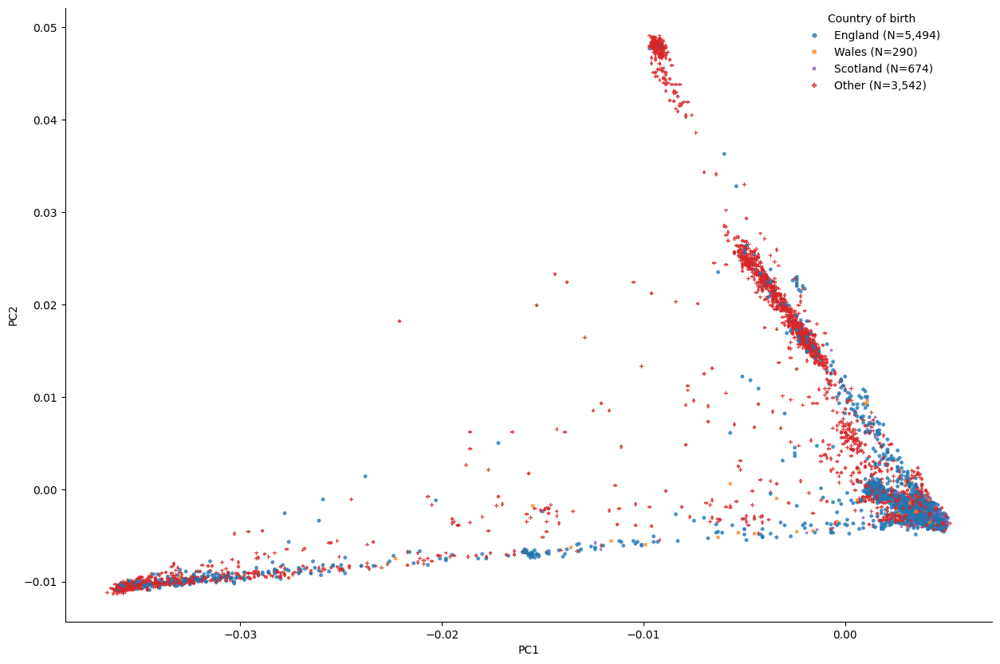

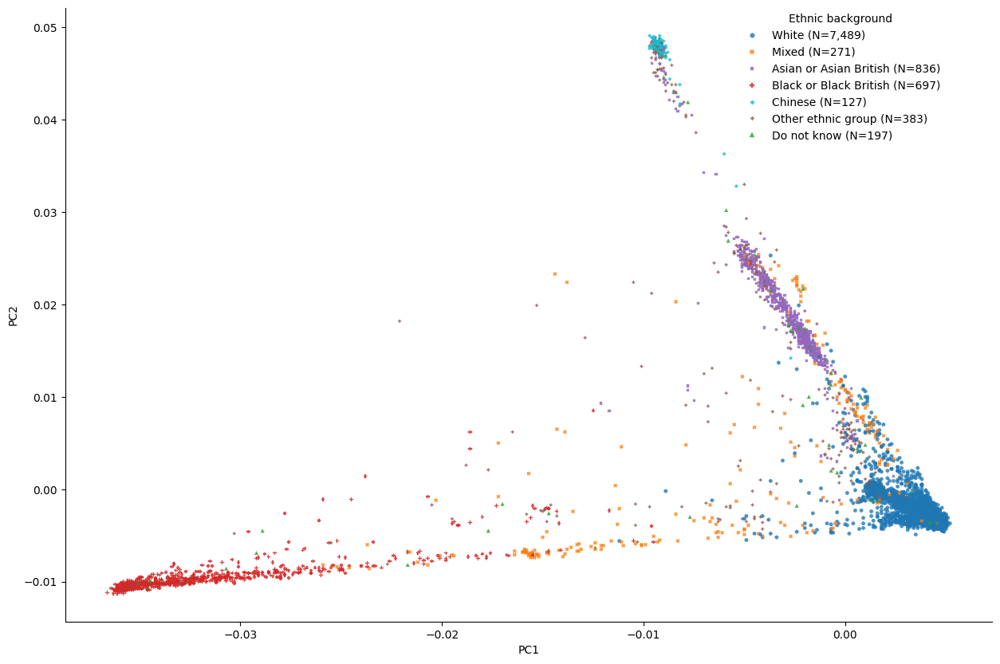

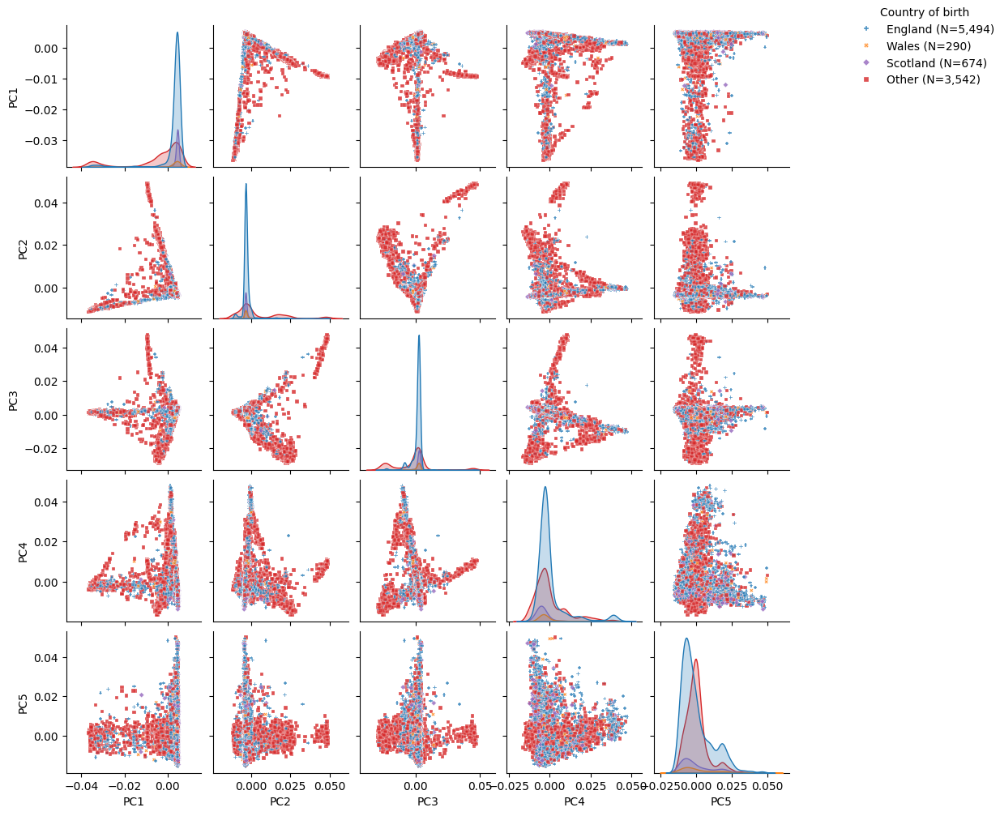

Done.


In [1]:
# running about 0.5 minutes
import sys
sys.path.append("/home/student/USER/GWAS/data/")
from plotPCA import plot_pca_plots

plot_pca_plots(
    eigenvec_file="/home/student/USER/GWAS/data/European_1w_fig.eigenvec",
    country_file="/home/student/USER/GWAS/data/European_1w_phenotypes.txt",
    save_figs=False
)

It shows the first several PCs capture **very strong population structure**.

The dataset exhibits pronounced population structure.

These PCs can be safely used as covariates in downstream GWAS.

## Tracy-Widom statistics

The twstats program computes Tracy-Widom statistics to evaluate the statistical significance of each principal component identified by pca.  

In [21]:
# the head 8 rows of Tracy-Widom statistics
awk 'NR > 35 && NR < 46' /home/student/USER/GWAS/data/European_1w_pca.txt

## Tracy-Widom statistics: rows: 10000  cols: 784256
  #N    eigenvalue  difference    twstat      p-value effect. n
   1    267.904311          NA  6935.282            0  1249.238
   2     85.641806 -182.262506 16467.926            0 10758.264
   3     27.427396  -58.214410 18345.254            0 56938.226
   4     14.540530  -12.886866 13526.745            0 99068.447
   5      8.699140   -5.841389  8627.566            0 123066.090
   6      4.969425   -3.729715  4365.905            0 133510.288
   7      4.628178   -0.341247  3998.900            0 136555.209
   8      4.245519   -0.382659  3555.823            0 139204.953



In [35]:
awk 'NR >= 38 && NR <= 10036 && $5 != "NA" && ($5+0) < 0.05' /home/student/USER/GWAS/data/European_1w_pca.txt | wc -l

676



Among the top 676 principal components (PCs) that showed statistical significance, we retained only the top 20 PCs for downstream analyses as an illustrative example."

In [32]:
head /home/student/USER/GWAS/data/covar_PCs.txt | column -t

FID      IID      PC1      PC2      PC3      PC4      PC5      PC6      PC7     PC8      PC9      PC10     PC11     PC12     PC13     PC14     PC15     PC16     PC17     PC18     PC19     PC20
1000992  1000992  -0.0036  0.0213   -0.0248  -0.0101  -0.0042  -0.0044  0.0073  -0.0018  0.0003   -0.0099  -0.0030  0.0045   -0.0000  0.0039   -0.0001  -0.0006  0.0100   0.0049   0.0052   0.0011
1001118  1001118  0.0031   -0.0034  -0.0012  0.0239   0.0047   0.0013   0.0033  -0.0103  0.0296   0.0034   0.0062   -0.0123  -0.0016  -0.0113  0.0034   0.0115   0.0165   -0.0075  0.0133   0.0009
1002621  1002621  0.0038   -0.0021  -0.0010  0.0094   -0.0033  -0.0068  0.0060  0.0042   0.0064   -0.0007  0.0129   -0.0125  0.0074   -0.0031  0.0080   -0.0049  -0.0028  -0.0038  -0.0160  -0.0001
1002993  1002993  -0.0356  -0.0106  0.0007   -0.0007  -0.0039  -0.0091  0.0065  -0.0003  -0.0056  0.0063   -0.0015  -0.0027  -0.0001  0.0084   -0.0031  -0.0100  0.0028   -0.0006  -0.0057  0.0005
1003258  1003258  0.0045  

Adiitionally, let's try to fix the issue by filtering SNPs. We can remove many of the error prone SNPs by removing

- SNPs that are not in HWE (Hardy weinberg Equilibrium) (option --hwe)

- the rare SNPs (difficult to genotype and very error prone) (option --maf)

- SNPs with lots of missing data (why?) (option --geno)

**Try to redo the above plink analysis by adding the additional filters**

--hwe 0.0001 --maf 0.05 --geno 0.05

which remove sites not in HWE (p-value 0.0001), low minor allele frequency (<5%), high genotype missingness (>5%).

- Can you now see patterns or gradients among individuals with respect to the quantitative trait?

Let us try to rerun an association analysis with these additional filters (and a new output name so we won't overwrite our old results). 

In [1]:
# # do not run!
# # running about 4 hours
# source /home/student/miniconda3/bin/activate gwas
# plink \
#   --bfile /home/student/USER/GWAS/data/European_1w \
#   --linear hide-covar \
#   --autosome \
#   --memory 5000 \
#   --out ./output/European_1w_QC_PC20 \
#   --hwe 0.0001 \
#   --maf 0.05 \
#   --geno 0.05 \
#   --covar /home/student/USER/GWAS/data/covar_PCs.txt \
#   --covar-name PC1-PC20
# conda deactivate

(gwas) PLINK v1.90b6.12 64-bit (28 Oct 2019)          www.cog-genomics.org/plink/1.9/
(C) 2005-2019 Shaun Purcell, Christopher Chang   GNU General Public License v3
Logging to ./output/European_1w_QC_PC20.log.
Options in effect:
  --autosome
  --bfile /home/student/USER/GWAS/data/European_1w
  --covar /home/student/USER/GWAS/data/covar_PCs.txt
  --covar-name PC1-PC20
  --geno 0.05
  --hwe 0.0001
  --linear hide-covar
  --maf 0.05
  --memory 5000
  --out ./output/European_1w_QC_PC20

515181 MB RAM detected; reserving 5000 MB for main workspace.
784256 variants loaded from .bim file.
10000 people (4475 males, 5525 females) loaded from .fam.
10000 phenotype values loaded from .fam.
Using 1 thread (no multithreaded calculations invoked).
--covar: 20 covariates loaded.
Before main variant filters, 10000 founders and 0 nonfounders present.
Calculating allele frequencies... done.
Total genotyping rate is 0.970031.
70335 variants removed due to missing genotype data (--geno).
--hwe: 99409 vari

Now try to plot the manhattan plot and the qqplot in R:

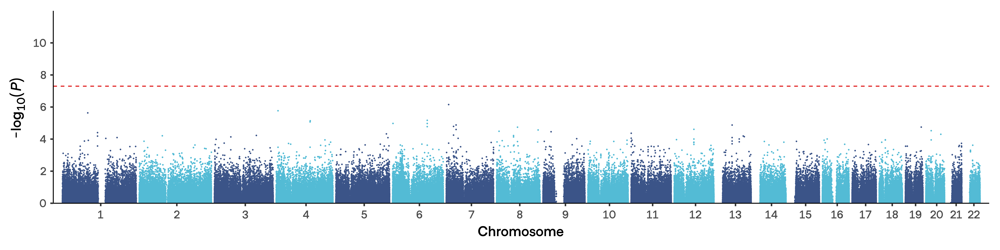

In [33]:
# running about 1 minutes
options(repr.plot.width = 16,
        repr.plot.height = 4,
        repr.plot.res = 600)
source("/home/student/USER/GWAS/data/plotPlink.R")

# plot the results (.assoc.linear is the output file from plink)
plots= plot_qqman(
  plink_assoc_file= "/home/student/USER/GWAS/data/European_1w_QC_PC20.assoc.linear",
  pheno_name= "Standing_height",
  save_plot = FALSE,
  lambda1_qq_pos = c(1.48, -5.5),
  lambda2_qq_pos = c(1.1, -4)
)
print(plots$manhattan_plot)

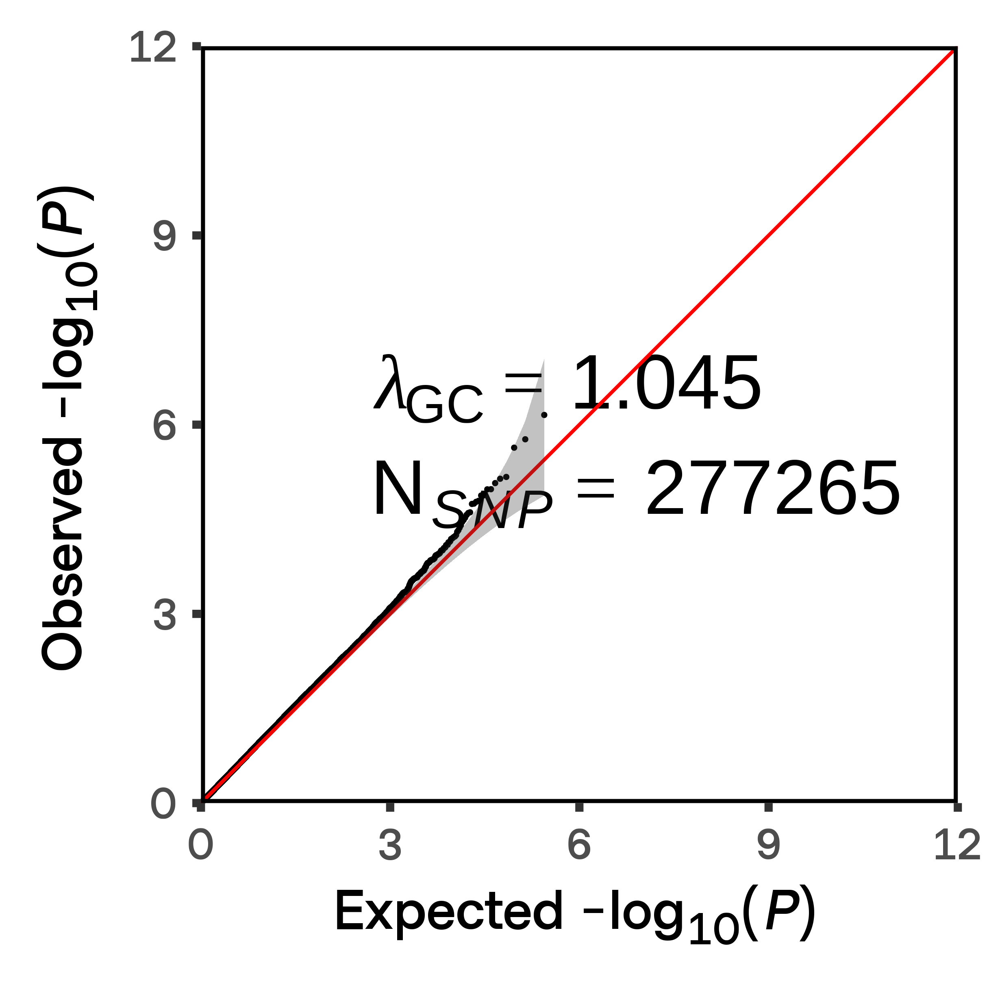

In [34]:
# running about 0.5 minutes
options(repr.plot.width = 4.1,
        repr.plot.height = 4.1,
        repr.plot.res = 600)
print(plots$qq_plot)

- How does the QQ plot look now - any signs of inflation?
- How many genome wide significant SNPs?

Information about the most significant SNPs is printed below.

Identify the chromosome, physical position (BP), beta and SNP name. 

In [18]:
head /home/student/USER/GWAS/data/European_1w_QC_PC20.assoc.linear
awk 'NR>1 {print $1,$2,$3,$9}' \
  /home/student/USER/GWAS/data/European_1w_QC_PC20.assoc.linear | sort -k4,4g 2>/dev/null | head -1 || true

 CHR             SNP         BP   A1       TEST    NMISS       BETA         STAT            P 
   1      rs57181708     809876    G        ADD     9990   0.000702       0.3443       0.7306
   1       rs4422948     835499    G        ADD     9803  0.0003526       0.2356       0.8138
   1       rs4970383     838555    A        ADD     9974   4.12e-05      0.02801       0.9777
   1       rs4970382     840753    C        ADD     9970   0.001852        1.414       0.1575
   1        rs950122     846864    C        ADD     9928  0.0001695       0.1042        0.917
   1      rs13303222     849998    A        ADD     9963 -0.0009964      -0.5865       0.5576
   1       rs6657440     850780    C        ADD     9980 -0.0004311       -0.324        0.746
   1       rs4970459     858051    T        ADD     9979   0.001015         0.62       0.5352
   1      rs74047407     866938    A        ADD     9987    0.00195         1.27       0.2042
7 rs7808919 7902687 7.02e-07



Let's try to plot the region with the most significant SNP in a 1 Mb window around this SNP:

In [19]:
awk '{$1=$1}1' OFS='\t' /home/student/USER/GWAS/data/European_1w_QC_PC20.assoc.linear > ./output/European_1w_QC_PC20.assoc_linear.txt
source /home/student/miniconda3/bin/activate py2
/home/student/USER/GWAS/locuszoom/bin/locuszoom \
    --metal ./output/European_1w_QC_PC20.assoc_linear.txt \
    --markercol SNP \
    --pvalcol P \
    --refsnp rs7808919 \
    --chr 7 \
    --flank 500kb \
    --pop EUR \
    --build hg19 \
    --source 1000G_March2012 \
    --prefix ./output/European_1w
conda deactivate

(py2) +-------------------------------------------+
| LocusZoom 1.4 (05/01/2017)                |
| Plot regional association results         |
| from GWA scans or candidate gene studies  |
+-------------------------------------------+

Loading settings..
Options in effect are:

+------------+--------------------------------------+
|   Option   |                Value                 |
+------------+--------------------------------------+
| metal      | European_1w_QC_PC20.assoc_linear.txt |
| markercol  | SNP                                  |
| pvalcol    | P                                    |
| refsnp     | rs7808919                            |
| flank      | 500000                               |
| build      | hg19                                 |
| ld-measure | rsquare                              |
| pop        | EUR                                  |
| source     | 1000G_March2012                      |
| snpset     | Illu1M                               |
| gene-table | ref

Open the figure manually using this path:

**./output/European_1w_250716_rs7808919/chr7_7402687-8402687.pdf**

# Exercise D: linear mixed model
Below you will apply a method called [regenie](https://rgcgithub.github.io/regenie/) that implemented linear mixed model for GWAS

## Step0: Format the data as needed


In [37]:
head /home/student/USER/GWAS/data/phenotype.txt

FID IID phenotype
3914956 3914956 1.75
3713468 3713468 1.56
5771003 5771003 1.59
5288656 5288656 1.71
4557604 4557604 1.41
3756910 3756910 1.48
1770301 1770301 1.66
2325183 2325183 1.625
1495340 1495340 1.94



#  Part 1: perform regenie analyses *without* considering the top 20 pcs

## Step1: fitting the null linear mixed model with regenie

For quantitative traits (such as standing height), regenie fits a linear mixed model by default.  
It is recommended to inverse normalize the phenotype before analysis to improve normality and statistical power.

In [51]:
# running about 2 minutes
source /home/student/miniconda3/bin/activate regenie_env
regenie \
  --step 1 \
  --bed /home/student/USER/GWAS/data/European_1w_QC \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --strict \
  --bsize 1000 \
  --loocv \
  --lowmem \
  --lowmem-prefix ./output/regenie_tmp_preds \
  --apply-rint \
  --out ./output/regenie_step1_WO_PC20
conda deactivate

(regenie_env) Start time: Sat Jul 19 14:42:15 2025

              |===========================|
              |      REGENIE v4.1.gz      |
              |===========================|

Copyright (c) 2020-2024 Joelle Mbatchou, Andrey Ziyatdinov and Jonathan Marchini.
Distributed under the MIT License.
Compiled with Boost Iostream library.
Using Intel MKL with Eigen.

Log of output saved in file : ./output/regenie_step1_WO_PC20.log

Options in effect:
  --step 1 \
  --bed /home/student/USER/GWAS/data/European_1w_QC \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --strict \
  --bsize 1000 \
  --loocv \
  --lowmem \
  --lowmem-prefix ./output/regenie_tmp_preds \
  --apply-rint \
  --out ./output/regenie_step1_WO_PC20

Fitting null model
 * bim              : [/home/student/USER/GWAS/data/European_1w_QC.bim] n_snps = 277265
 * fam              : [/home/student/USER/GWAS/data/European_1w_QC.fam] n_samples = 10000
 * bed              : [/home/student/USER/GWAS/data/European_1w_

See more parameter explanations: https://rgcgithub.github.io/regenie/options/.

## Step 2: performing single-variant association tests

For quantitative traits (such as standing height), regenie automatically uses a linear mixed model for association testing.

There is no need for saddle point approximation or Firth correction, as these are specific to binary traits.

The output will include effect sizes, standard errors, and p-values for each variant.

In [20]:
# running about 0.5 minutes
source /home/student/miniconda3/bin/activate regenie_env
regenie \
  --step 2 \
  --bed /home/student/USER/GWAS/data/European_1w_QC \
  --ref-first \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --strict \
  --bsize 1000 \
  --apply-rint \
  --pred ./output/regenie_step1_WO_PC20_pred.list \
  --out ./output/regenie_step2_asso_WO_PC20
conda deactivate

(regenie_env) Start time: Tue Jul 22 22:02:47 2025

              |===========================|
              |      REGENIE v4.1.gz      |
              |===========================|

Copyright (c) 2020-2024 Joelle Mbatchou, Andrey Ziyatdinov and Jonathan Marchini.
Distributed under the MIT License.
Compiled with Boost Iostream library.
Using Intel MKL with Eigen.

Log of output saved in file : ./output/regenie_step2_asso_WO_PC20.log

Options in effect:
  --step 2 \
  --bed /home/student/USER/GWAS/data/European_1w_QC \
  --ref-first \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --strict \
  --bsize 1000 \
  --apply-rint \
  --pred ./output/regenie_step1_WO_PC20_pred.list \
  --out ./output/regenie_step2_asso_WO_PC20

Association testing mode with fast multithreading using OpenMP
 * bim              : [/home/student/USER/GWAS/data/European_1w_QC.bim] n_snps = 277265
 * fam              : [/home/student/USER/GWAS/data/European_1w_QC.fam] n_samples = 10000
 * bed        

### View the result of REGENIE-GWAS


In [21]:
head ./output/regenie_step2_asso_WO_PC20_phenotype.regenie | column -t

CHROM  GENPOS  ID          ALLELE0  ALLELE1  A1FREQ    N   TEST  BETA        SE        CHISQ        LOG10P      EXTRA
1      809876  rs57181708  G        A        0.922222  45  ADD   0.819157    0.466077  3.08901      1.10335     NA
1      835499  rs4422948   G        A        0.77907   43  ADD   0.344908    0.319173  1.16776      0.553057    NA
1      838555  rs4970383   A        C        0.766667  45  ADD   0.00674357  0.29065   0.000538318  0.00811439  NA
1      840753  rs4970382   C        T        0.588889  45  ADD   0.0986217   0.23848   0.171018     0.167997    NA
1      846864  rs950122    C        G        0.811111  45  ADD   0.234648    0.27831   0.710847     0.39885     NA
1      849998  rs13303222  A        G        0.9       45  ADD   -0.147105   0.373592  0.155046     0.158791    NA
1      850780  rs6657440   C        T        0.7       45  ADD   0.0901261   0.237315  0.144229     0.152358    NA
1      858051  rs4970459   T        C        0.8       45  ADD   0.135413    

In [54]:
# search for the most significant SNP
awk 'NR>1 {print $1,$2,$3,$12}' \
  ./output/regenie_step2_asso_WO_PC20_phenotype.regenie | sort -k4,4gr 2>/dev/null | head -1 || true

5 78413504 rs3797546 9.13966



In [55]:
# Prepare for plotting the results
regenie_results= data.table::fread("./output/regenie_step2_asso_WO_PC20_phenotype.regenie")
regenie_results[, P := 10^(-LOG10P)] %>%
    data.table::setnames(
        c("CHROM", "GENPOS", "ID"),
        c("CHR", "BP", "SNP")
    )
regenie_results %>%
    data.table::fwrite("./output/regenie_step2_asso_WO_PC20_phenotype_v2.regenie")

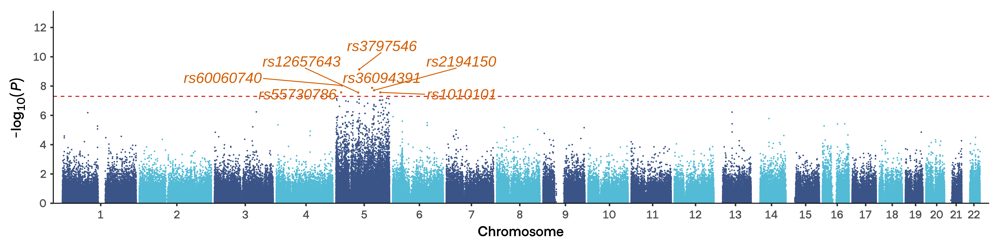

In [56]:
# running about 0.5 minutes
options(repr.plot.width = 16,
        repr.plot.height = 4,
        repr.plot.res = 600)
source("/home/student/USER/GWAS/data/plotPlink.R")

# plot the results (.regenie is the output file from regenie)
plots= plot_qqman(
  plink_assoc_file= "./output/regenie_step2_asso_WO_PC20_phenotype_v2.regenie",
  pheno_name= "Standing_height",
  save_plot = FALSE,
  lambda1_qq_pos = c(1.48, -5.5),
  lambda2_qq_pos = c(1.1, -4)
)
print(plots$manhattan_plot)

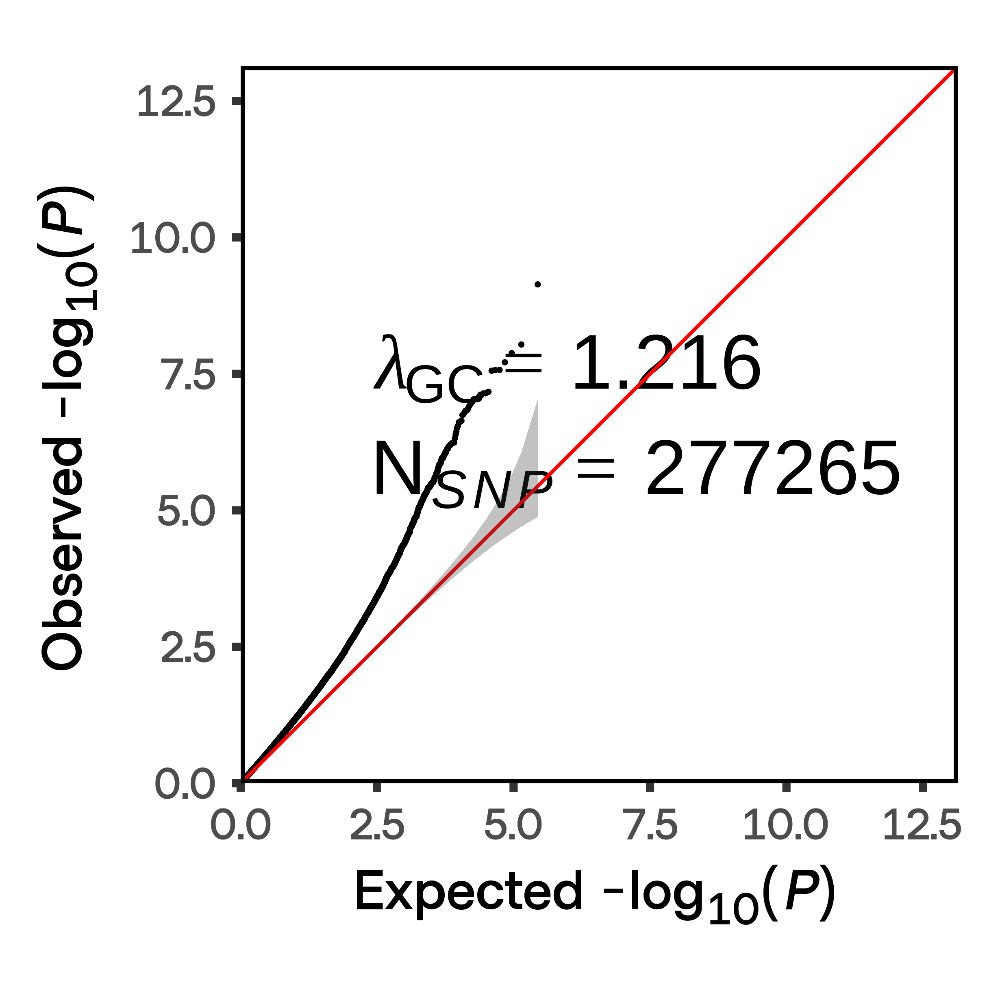

In [57]:
# running about 0.5 minutes
options(repr.plot.width = 4.1,
        repr.plot.height = 4.1,
        repr.plot.res = 600)
print(plots$qq_plot)

#  Part 2: perform regenie analyses *with* considering the top 20 pcs

## Step1: fitting the null linear mixed model with regenie

For quantitative traits (such as standing height), regenie fits a linear mixed model by default.  
It is recommended to inverse normalize the phenotype before analysis to improve normality and statistical power.

In [59]:
# running about 2 minutes
source /home/student/miniconda3/bin/activate regenie_env
regenie \
  --step 1 \
  --bed /home/student/USER/GWAS/data/European_1w_QC \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --covarFile /home/student/USER/GWAS/data/covar_PCs.txt \
  --strict \
  --bsize 1000 \
  --loocv \
  --lowmem \
  --lowmem-prefix ./output/regenie_tmp_preds \
  --apply-rint \
  --out ./output/regenie_step1_W_PC20
conda deactivate

(regenie_env) Start time: Sat Jul 19 14:49:02 2025

              |===========================|
              |      REGENIE v4.1.gz      |
              |===========================|

Copyright (c) 2020-2024 Joelle Mbatchou, Andrey Ziyatdinov and Jonathan Marchini.
Distributed under the MIT License.
Compiled with Boost Iostream library.
Using Intel MKL with Eigen.

Log of output saved in file : ./output/regenie_step1_W_PC20.log

Options in effect:
  --step 1 \
  --bed /home/student/USER/GWAS/data/European_1w_QC \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --covarFile /home/student/USER/GWAS/data/covar_PCs.txt \
  --strict \
  --bsize 1000 \
  --loocv \
  --lowmem \
  --lowmem-prefix ./output/regenie_tmp_preds \
  --apply-rint \
  --out ./output/regenie_step1_W_PC20

Fitting null model
 * bim              : [/home/student/USER/GWAS/data/European_1w_QC.bim] n_snps = 277265
 * fam              : [/home/student/USER/GWAS/data/European_1w_QC.fam] n_samples = 10000
 * bed 

See more parameter explanations: https://rgcgithub.github.io/regenie/options/.

## Step 2: performing single-variant association tests

For quantitative traits (such as standing height), regenie automatically uses a linear mixed model for association testing.

There is no need for saddle point approximation or Firth correction, as these are specific to binary traits.

The output will include effect sizes, standard errors, and p-values for each variant.

In [8]:
# running about 0.5 minutes
source /home/student/miniconda3/bin/activate regenie_env
regenie \
  --step 2 \
  --bed /home/student/USER/GWAS/data/European_1w_QC \
  --covarFile /home/student/USER/GWAS/data/covar_PCs.txt \
  --ref-first \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --strict \
  --bsize 1000 \
  --apply-rint \
  --pred ./output/regenie_step1_W_PC20_pred.list \
  --out ./output/regenie_step2_asso_W_PC20
conda deactivate

(regenie_env) Start time: Tue Jul 22 14:57:40 2025

              |===========================|
              |      REGENIE v4.1.gz      |
              |===========================|

Copyright (c) 2020-2024 Joelle Mbatchou, Andrey Ziyatdinov and Jonathan Marchini.
Distributed under the MIT License.
Compiled with Boost Iostream library.
Using Intel MKL with Eigen.

Log of output saved in file : ./output/regenie_step2_asso_W_PC20.log

Options in effect:
  --step 2 \
  --bed /home/student/USER/GWAS/data/European_1w_QC \
  --covarFile /home/student/USER/GWAS/data/covar_PCs.txt \
  --ref-first \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --strict \
  --bsize 1000 \
  --apply-rint \
  --pred ./output/regenie_step1_W_PC20_pred.list \
  --out ./output/regenie_step2_asso_W_PC20

Association testing mode with fast multithreading using OpenMP
 * bim              : [/home/student/USER/GWAS/data/European_1w_QC.bim] n_snps = 277265
 * fam              : [/home/student/USER/GWAS/d

In [9]:
# running about 0.5 minutes
source /home/student/miniconda3/bin/activate regenie_env
regenie \
  --step 2 \
  --bed /home/student/USER/GWAS/data/v2_backup_20250718/European_1w_imp \
  --covarFile /home/student/USER/GWAS/data/covar_PCs.txt \
  --chr 22\
  --ref-first \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --strict \
  --bsize 1000 \
  --apply-rint \
  --pred ./output/regenie_step1_W_PC20_pred.list \
  --out ./output/regenie_step2_asso_W_PC20
conda deactivate

(regenie_env) Start time: Tue Jul 22 14:57:51 2025

              |===========================|
              |      REGENIE v4.1.gz      |
              |===========================|

Copyright (c) 2020-2024 Joelle Mbatchou, Andrey Ziyatdinov and Jonathan Marchini.
Distributed under the MIT License.
Compiled with Boost Iostream library.
Using Intel MKL with Eigen.

Log of output saved in file : ./output/regenie_step2_asso_W_PC20.log

Options in effect:
  --step 2 \
  --bed /home/student/USER/GWAS/data/v2_backup_20250718/European_1w_imp \
  --covarFile /home/student/USER/GWAS/data/covar_PCs.txt \
  --chr 22 \
  --ref-first \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --strict \
  --bsize 1000 \
  --apply-rint \
  --pred ./output/regenie_step1_W_PC20_pred.list \
  --out ./output/regenie_step2_asso_W_PC20

Association testing mode with fast multithreading using OpenMP
 * bim              : [/home/student/USER/GWAS/data/v2_backup_20250718/European_1w_imp.bim] n_snps = 10

### View the result of REGENIE-GWAS


In [10]:
head ./output/regenie_step2_asso_W_PC20_phenotype.regenie | column -t

CHROM  GENPOS    ID           ALLELE0  ALLELE1  A1FREQ    N     TEST  BETA         SE         CHISQ       LOG10P      EXTRA
22     16050822  rs12172168   A        G        0.915078  3409  ADD   0.0342386    0.0428313  0.639011    0.372563    NA
22     16051249  rs62224609   C        T        0.901309  9930  ADD   0.0178266    0.0233593  0.582395    0.351274    NA
22     16052080  rs4965031    A        G        0.941281  2810  ADD   0.0402953    0.056448   0.50958     0.323013    NA
22     16052167  rs375684679  AAAAC    A        0.508792  2161  ADD   0.0553284    0.142861   0.149992    0.155807    NA
22     16052962  rs376238049  T        C        0.956589  8788  ADD   0.0207208    0.0360476  0.330415    0.247633    NA
22     16053444  rs80167676   T        A        0.97472   6685  ADD   0.000972332  0.0533267  0.00033246  0.00636427  NA
22     16053659  rs915675     A        C        0.871927  2034  ADD   -0.085304    0.0491545  3.0117      1.08268     NA
22     16053730  rs117569664 

In [11]:
# search for the most significant SNP
awk 'NR>1 {print $1,$2,$3,$12}' \
  ./output/regenie_step2_asso_W_PC20_phenotype.regenie | sort -k4,4gr 2>/dev/null | head -1 || true

22 17670257 rs78024025 5.00957



In [6]:
# Prepare for plotting the results
library(magrittr)
regenie_results= data.table::fread("./output/regenie_step2_asso_W_PC20_phenotype.regenie")
regenie_results[, P := 10^(-LOG10P)] %>%
    data.table::setnames(
        c("CHROM", "GENPOS", "ID"),
        c("CHR", "BP", "SNP")
    )
regenie_results %>%
    data.table::fwrite("./output/regenie_step2_asso_W_PC20_phenotype_v2.regenie")

Warning message:
“程序包‘magrittr’是用R版本4.4.1 来建造的”


In [ ]:
# running about 0.5 minutes
options(repr.plot.width = 16,
        repr.plot.height = 4,
        repr.plot.res = 600)
source("/home/student/USER/GWAS/data/plotPlink.R")

# plot the results (.regenie is the output file from regenie)
plots= plot_qqman(
  plink_assoc_file= "./output/regenie_step2_asso_W_PC20_phenotype_v2.regenie",
  pheno_name= "Standing_height",
  save_plot = FALSE,
  lambda1_qq_pos = c(1.48, -5.5),
  lambda2_qq_pos = c(1.1, -4)
)
print(plots$manhattan_plot)

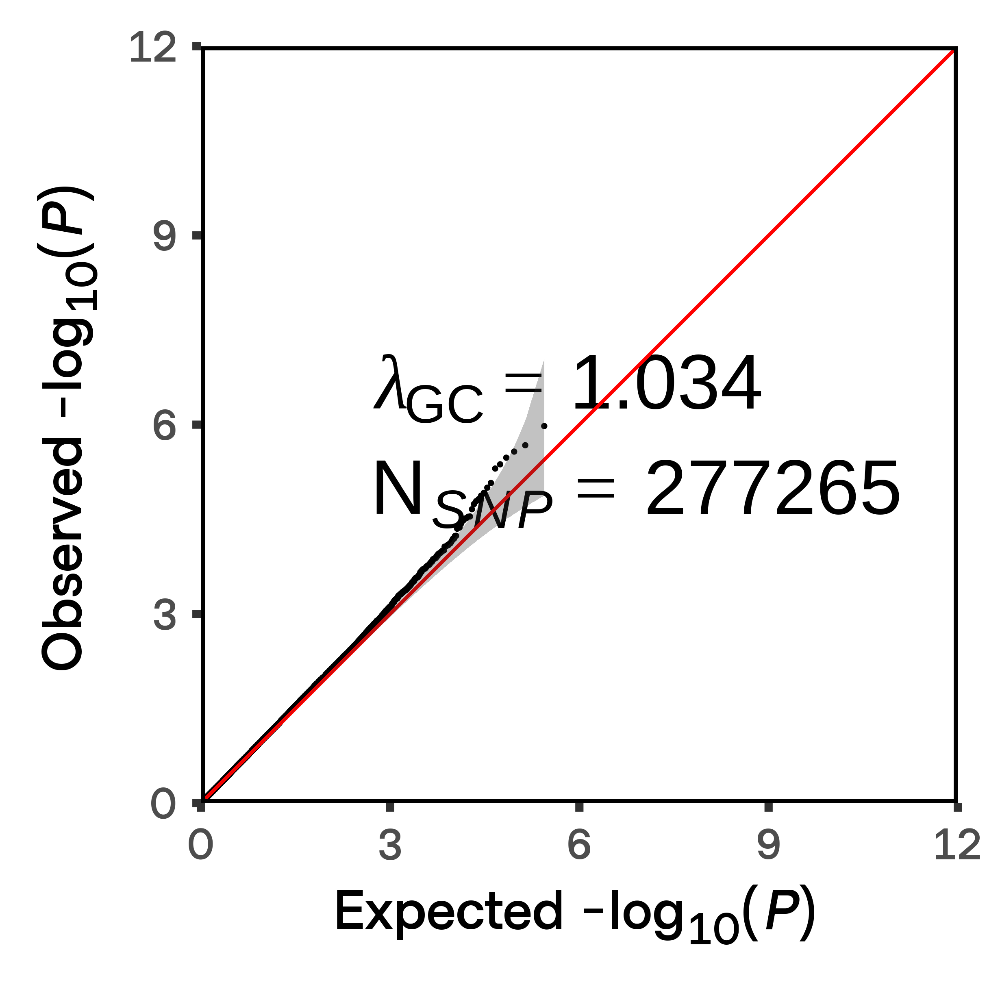

In [65]:
# running about 0.5 minutes
options(repr.plot.width = 4.1,
        repr.plot.height = 4.1,
        repr.plot.res = 600)
print(plots$qq_plot)

# Exercise E : Gene-based testing

Instead of performing single-variant association tests, multiple variants can be aggregated in a given region, such as a gene.

This can be especially helpful when testing **rare variants** as single-vatiant tests usuaally have lower power performance.

To avoid inflation in the gene-based tets due to rare variants as well as reduce computation time, we can implement the collapsing approach of gene-based testing proposed in SAIGE-GENE+, where ultra-rare variants are aggregated into a mask.

### Annotation input files: to define variant sets and functional annotations which will be used to generate masks.

Each line contains the variant name, the set/gene name and a single annotation category (space/tab separated).

Variants not in this file will be assigned to a default "NULL" category. A maximum of 63 annotation categories (+NULL category) is allowed.

To obtain a single annotation per gene, we could choose the most deleterious functional annotation across the gene transcripts or alternatively use the canonical transcript (note that its definition can vary across software).

In [12]:
head /home/student/USER/GWAS/data/anno_file.txt | column -t

rs2334338             U6        Noncoding
22:16144238_CT_C      U6        Noncoding
rs529750096           ABCD1P4   Noncoding
rs7285246             PABPC1P9  Noncoding
rs9617234             SLC9B1P4  Noncoding
rs201639724           SLC9B1P4  Noncoding
rs565789739           SLC9B1P4  Noncoding
22:16432988_GTACT_G   SLC9B1P4  Noncoding
22:16434935_TCCTAA_T  SLC9B1P4  Noncoding
rs9617238             SLC9B1P4  Noncoding



### Set list file: to list variants within each set/gene to use when building masks.

Each line contains the set/gene name followed by a chromosome and physical position for the set/gene, then by a comma-separated list of variants included in the set/gene.


In [13]:
head /home/student/USER/GWAS/data/set_list.txt | column -t

U6          22  16143946  rs2334338,22:16144238_CT_C
ABCD1P4     22  16384531  rs529750096
PABPC1P9    22  16425814  rs7285246
SLC9B1P4    22  16429472  rs9617234,rs201639724,rs565789739,22:16432988_GTACT_G,22:16434935_TCCTAA_T,rs9617238,rs2212194,rs202204800,rs9617244,rs200596554,rs201265605,rs199810539,rs572119925,rs2000508,rs78350717,rs201369337,rs200639740,rs367744914,rs200741211,rs201464764,rs11167316,rs370772954,rs2236636,rs2078653,rs8184977,rs8135765,rs200598360,rs7288502,rs7287695,rs201141516,rs200197183,rs12628801
ACTR3BP6    22  16482298  rs7510928,rs2027643,rs373129713,rs2268774,22:16490252_CT_C,rs9617160,rs1807637
CHEK2P4     22  16498387  rs2186521,rs200058026,rs7287988,rs6010332,rs11167331,rs2212222,rs6010340,rs201979747,rs4911646,rs12053778,rs2309185,rs200691663
KCNMB3P1    22  16578328  rs564070021,rs370487180
CCT8L2      22  16586715  rs2154927,rs201451756,rs6010291,rs4350859,rs117347043,rs117578132
TPTEP1      22  16601412  rs138900103,rs5771521,rs1988773,rs5771523,rs

### Mask file

This file specifies which annotation categories should be combined into masks.

Each line contains a mask name followed by a comma-separated list of categories included in the mask (i.e. union is taken over categories).

In [14]:
head /home/student/USER/GWAS/data/mask_file.txt | column -t

LoF                LoF
LoF_Splice_Region  LoF,Splice_Region
Damaging_All       LoF,Splice_Region,Missense
Missense_All       Missense
Splice_Region      Splice_Region
Synonymous         Synonymous
Noncoding          Noncoding



### Checking input files

To assess the concordance between the input files for building masks, we can use **--check-burden-files** which will generate a report in **file_masks_report.txt** containing:

- for each set, the list the variants in the set-list file which are unrecognized (not genotyped or not present in annotation file for the set)

- for each mask, the list of annotations in the mask definition file which are not in the annotation file

Additionally, we can use **--strict-check-burden** to enforce full agreement between the three files (if not, program will terminate) :

- all genotyped variants in the set list file must be in the annotation file (for the corresponding set)

- all annotations in the mask definition file must be present in the annotation file

In [15]:
source /home/student/miniconda3/bin/activate regenie_env
regenie \
  --step 2 \
  --bed /home/student/USER/GWAS/data/European_1w \
  --covarFile /home/student/USER/GWAS/data/covar_PCs.txt \
  --ref-first \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --strict \
  --bsize 1000 \
  --apply-rint \
  --pred ./output/regenie_step1_W_PC20_pred.list \
  --check-burden-files \
  --anno-file /home/student/USER/GWAS/data/anno_file.txt \
  --set-list /home/student/USER/GWAS/data/set_list.txt \
  --mask-def /home/student/USER/GWAS/data/mask_file.txt \
  --skip-test \
  --strict-check-burden \
  --out ./output/burden_check
conda deactivate

(regenie_env) Start time: Tue Jul 22 14:59:04 2025

              |===========================|
              |      REGENIE v4.1.gz      |
              |===========================|

Copyright (c) 2020-2024 Joelle Mbatchou, Andrey Ziyatdinov and Jonathan Marchini.
Distributed under the MIT License.
Compiled with Boost Iostream library.
Using Intel MKL with Eigen.

Log of output saved in file : ./output/burden_check.log

Options in effect:
  --step 2 \
  --bed /home/student/USER/GWAS/data/European_1w \
  --covarFile /home/student/USER/GWAS/data/covar_PCs.txt \
  --ref-first \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --strict \
  --bsize 1000 \
  --apply-rint \
  --pred ./output/regenie_step1_W_PC20_pred.list \
  --check-burden-files \
  --anno-file /home/student/USER/GWAS/data/anno_file.txt \
  --set-list /home/student/USER/GWAS/data/set_list.txt \
  --mask-def /home/student/USER/GWAS/data/mask_file.txt \
  --strict-check-burden \
  --out ./output/burden_check

Ass

In [21]:
source /home/student/miniconda3/bin/activate regenie_env
regenie \
  --step 2 \
  --bed /home/student/USER/GWAS/data/v2_backup_20250718/European_1w_imp \
  --covarFile /home/student/USER/GWAS/data/covar_PCs.txt \
  --chr 22\
  --ref-first \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --strict \
  --bsize 1000 \
  --apply-rint \
  --pred ./output/regenie_step1_W_PC20_pred.list \
  --check-burden-files \
  --anno-file /home/student/USER/GWAS/data/anno_file.txt \
  --set-list /home/student/USER/GWAS/data/set_list.txt \
  --mask-def /home/student/USER/GWAS/data/mask_file.txt \
  --skip-test \
  --strict-check-burden \
  --out ./output/burden_check
conda deactivate

(regenie_env) Start time: Tue Jul 22 15:09:08 2025

              |===========================|
              |      REGENIE v4.1.gz      |
              |===========================|

Copyright (c) 2020-2024 Joelle Mbatchou, Andrey Ziyatdinov and Jonathan Marchini.
Distributed under the MIT License.
Compiled with Boost Iostream library.
Using Intel MKL with Eigen.

Log of output saved in file : ./output/burden_check.log

Options in effect:
  --step 2 \
  --bed /home/student/USER/GWAS/data/v2_backup_20250718/European_1w_imp \
  --covarFile /home/student/USER/GWAS/data/covar_PCs.txt \
  --chr 22 \
  --ref-first \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --strict \
  --bsize 1000 \
  --apply-rint \
  --pred ./output/regenie_step1_W_PC20_pred.list \
  --check-burden-files \
  --anno-file /home/student/USER/GWAS/data/anno_file.txt \
  --set-list /home/student/USER/GWAS/data/set_list.txt \
  --mask-def /home/student/USER/GWAS/data/mask_file.txt \
  --strict-check-burden 

### AAF file

Both functional annotations and alternative allele frequency (AAF) cutoffs are used when building masks (e.g. only considering LoF sites where AAF is below 1%).

By default, the AAF for each variant is computed from the sample but alternatively, the user can specify variant AAFs using this file.

### AAF cutoffs

Option **--aaf-bins** specifies the AAF upper bounds used to generate burden masks (AAF and not MAF [minor allele frequency] is used when deciding which variants go into a mask).

By default, a mask based on singleton sites are always included.

For example, **--aaf-bins 0.01,0.05** will generate 3 burden masks for AAFs in [0,0.01], [0,0.05] and singletons.

## SKAT/ACAT tests

The option **--vc-tests** is used to specify the gene-based tests to run. By default, these tests use all variants in each mask category.

If you'd like to only include variants whose AAF is below a given threshold ,e.g. only including rare variants, you can use --vc-maxAAF.

For example, **--vc-tests skato,acato-full** will run SKATO and ACATO (both using the default grid of 8 rho values for the SKATO models) and the p-values for SKAT, SKATO, ACATV and ACATO will be output.

**Ultra-rare variants** (defined by default as MAC ≤ 10, see --vc-MACthr) are collapsed into a burden mask which is then included in the tests instead of the individual variants.

## Joint test for burden masks

The ACAT test combines the p-values of the individual burden masks using the Cauchy combination method.

If you only want to output the results for the joint tests (ignore the marginal tests), use **--joint-only**.

In [22]:
source /home/student/miniconda3/bin/activate regenie_env
regenie \
  --step 2 \
  --bed /home/student/USER/GWAS/data/v2_backup_20250718/European_1w_imp \
  --chr 22 \
  --covarFile /home/student/USER/GWAS/data/covar_PCs.txt \
  --ref-first \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --strict \
  --bsize 1000 \
  --apply-rint \
  --pred ./output/regenie_step1_W_PC20_pred.list \
  --anno-file /home/student/USER/GWAS/data/anno_file.txt \
  --set-list /home/student/USER/GWAS/data/set_list.txt \
  --mask-def /home/student/USER/GWAS/data/mask_file.txt \
  --rgc-gene-p \
  --vc-tests skato,acato-full \
  --joint acat,sbat \
  --vc-MACthr 10 \
  --out ./output/gene_based_testing
conda deactivate

(regenie_env) Start time: Tue Jul 22 15:10:02 2025

              |===========================|
              |      REGENIE v4.1.gz      |
              |===========================|

Copyright (c) 2020-2024 Joelle Mbatchou, Andrey Ziyatdinov and Jonathan Marchini.
Distributed under the MIT License.
Compiled with Boost Iostream library.
Using Intel MKL with Eigen.

Log of output saved in file : ./output/gene_based_testing.log

Options in effect:
  --step 2 \
  --bed /home/student/USER/GWAS/data/v2_backup_20250718/European_1w_imp \
  --chr 22 \
  --covarFile /home/student/USER/GWAS/data/covar_PCs.txt \
  --ref-first \
  --phenoFile /home/student/USER/GWAS/data/phenotype.txt \
  --strict \
  --bsize 1000 \
  --apply-rint \
  --pred ./output/regenie_step1_W_PC20_pred.list \
  --anno-file /home/student/USER/GWAS/data/anno_file.txt \
  --set-list /home/student/USER/GWAS/data/set_list.txt \
  --mask-def /home/student/USER/GWAS/data/mask_file.txt \
  --rgc-gene-p \
  --vc-tests skato,acato-f

For each set, this will produce masks using 3 AAF cutoffs (singletons, 5% and 10% AAF).

The masks are written to PLINK bed file (in **_masks.{bed,bim,fam}**) and tested for association with each trait (summary stats in **_phenotype_name.regenie**).

Additionally, a header line is included (starting with ##) which contains mask definition information.

Masks will have name set_name.mask_name.AAF_cutoff with the chromosome and physical position having been defined in the set list file, and the reference allele being ref, and the alternate allele corresponding to **mask_name.AAF_cutoff**.

When using **--rgc-gene-p**, it will apply the single p-value per gene GENE_P strategy using all masks.

## Excercise F: Calculate GWAS power


Now we generate a statistical power analysis plot for GWAS studies.

Supports binary (case-control) traits over a range of odds ratios and minor allele frequencies, and quantitative traits over a range of effect sizes and minor allele frequencies.


### Part1 : Quantitative traits

In our above example, standing height is the quantitative trait.

In [78]:
# calculate the standard deviation of the quantitative trait
import pandas as pd
df = pd.read_table(
    '/home/student/USER/GWAS/data/European_1w_phenotypes.txt',
    sep = '\\s+',
    header = 0
)
print(df.shape)
df['Standing_height'].std(skipna=True)

(10000, 11)


np.float64(0.09365788681305078)

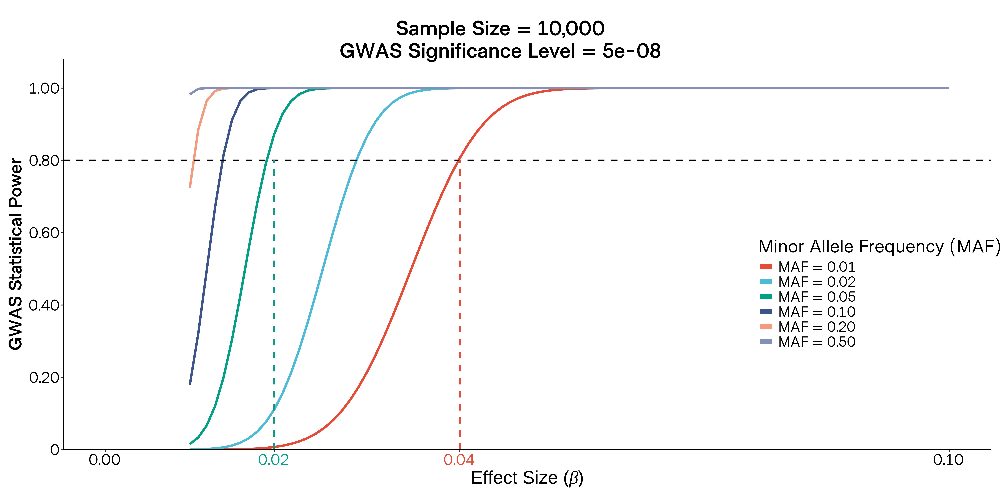

In [1]:
options(repr.plot.width = 16,
        repr.plot.height = 8,
        repr.plot.res = 600)
source("/home/student/USER/GWAS/data/plotPlink.R")
power_results_qt <- plot_gwas_power(
        trait_type = "qt",
        sd_trait = 0.09365788681305078,
        N = 10000,
        maf_levels = c(0.01, 0.02, 0.05, 0.10, 0.20, 0.50),
        effect_size = seq(0.01, 0.10, 0.001),
        save_plot = FALSE
    )
print(power_results_qt$plot)

### Part2: Binary traits

Now we generate a statistical power analysis plot for a given range of odds ratios and minor allele frequencies in a **case-control** GWAS study. 

Statistical power is crucial for designing a successful GWAS.

It helps you determine the probability of detecting a true association, given a specific sample size, allele frequency, and effect size (Odds Ratio).

### Example Usage

Let's run the example with a sample dataset:

- Cases: 4,324

- Controls: 93,945

- Odds Ratios: Ranging from 1.01 to 2.00

- MAF: 0.01, 0.02, 0.05, 0.10, 0.20, 0.50

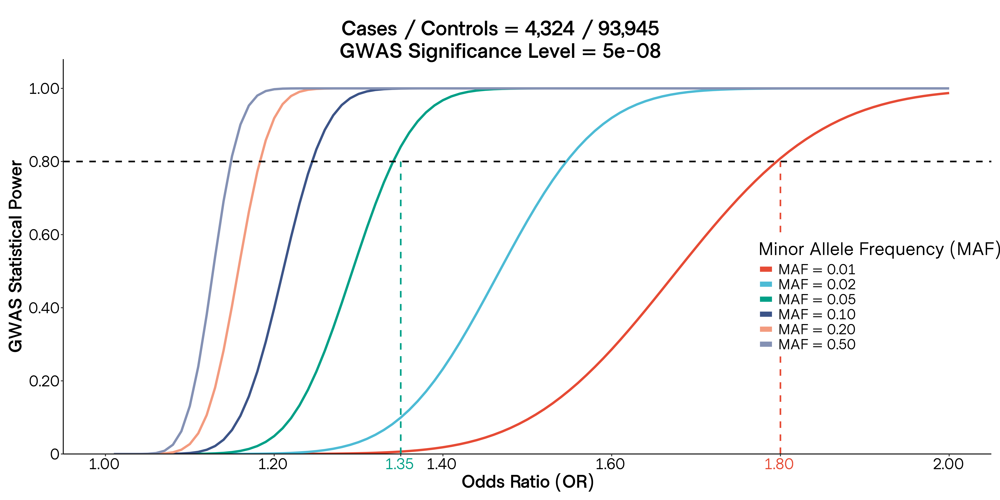

In [1]:
options(repr.plot.width = 16,
        repr.plot.height = 8,
        repr.plot.res = 600)
source("/home/student/USER/GWAS/data/plotPlink.R")

power_results <- plot_gwas_power(
        trait_type = "bt",
        n_cases = 4324,
        n_controls = 93945,
        maf_levels = c(0.01, 0.02, 0.05, 0.10, 0.20, 0.50),
        or_range = seq(1.01, 2.00, 0.01),
        save_plot = FALSE
    )
print(power_results$plot)